# Basic Data Gathering

- Extracting basic dependencies between typescript modules
- Every .tsx file is taken into consideration

In [50]:
def module_name_from_file_path(full_path):

    # e.g. ../core/model/user.py -> zeeguu.core.model.user

    file_name = full_path
    file_name = file_name.replace("Anytype/","")
    file_name = file_name.replace("/",".")
    file_name = file_name.replace(".ts","")
    file_name = file_name.replace(".tsx","")
    return file_name

In [51]:
import re

import_pattern = re.compile(r'import\s+(?:[\w*\s{},]*)\s+from\s+["\'](.+?)["\']')


In [52]:
import os

all_files = []

rootdir = "Anytype/"

for subdir, dirs, files in os.walk(rootdir):
    for file in files:
        if file.endswith('.ts') or file.endswith('.tsx'):
            all_files.append(os.path.join(subdir, file))

# Just a little test to see if it indeed captures even very nested files
assert 'Anytype/src/ts/model/content/bookmark.ts' in all_files

In [ ]:
import_dict = {}

for file in all_files:
    try:
        with open(file, "r", encoding="utf-8") as f:
            content = f.read()
            all_imports = import_pattern.findall(content)
            if all_imports:
                import_dict[module_name_from_file_path(file)] = all_imports
            else:
                #needed to add this otherwise it would give a key error on files with no imports
                import_dict[module_name_from_file_path(file)] = []
    except UnicodeDecodeError:
        print(f"Skipping non-text file: {file}")
    except Exception as e:
        print(f"Error processing {file}: {str(e)}")

print("\n=== bookmarks has imports Lib and mobx ===")
print(import_dict[module_name_from_file_path("src/ts/model/content/bookmark.ts")])
assert ['Lib', 'mobx'] == import_dict[module_name_from_file_path("src/ts/model/content/bookmark.ts")]


=== bookmarks has imports Lib and mobx ===
['Lib', 'mobx']


# Extract Dependencies between all files

In [54]:
import networkx as nx
import matplotlib.pyplot as plt

G = nx.Graph()

for file in all_files:

    module_name = module_name_from_file_path(file)

    if module_name not in G.nodes:
        G.add_node(module_name)

    for each in import_dict[module_name]:
        G.add_edge(module_name, each)

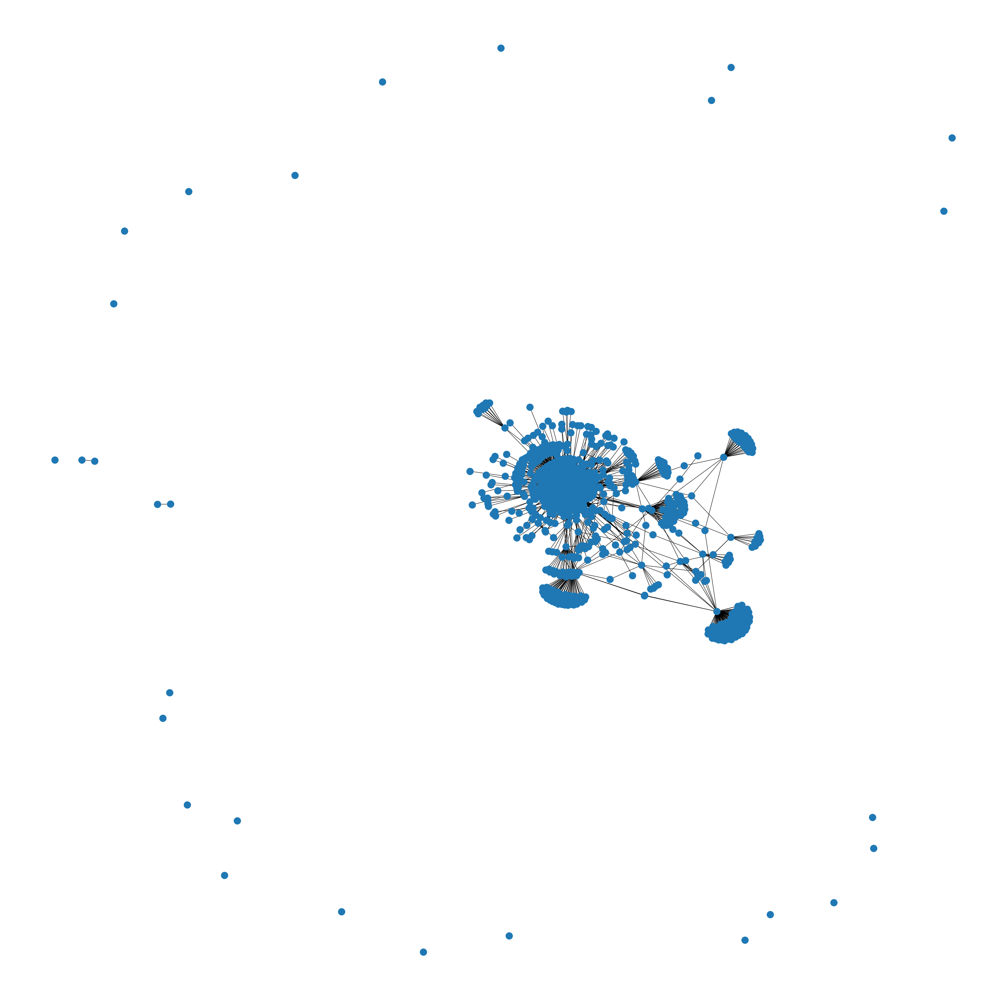

In [61]:
# a function to draw a graph
def draw_graph(G, size, **args):
    plt.figure(figsize=size)
    nx.draw(G, **args)
    plt.show()


draw_graph(G, (35,35), with_labels=False)

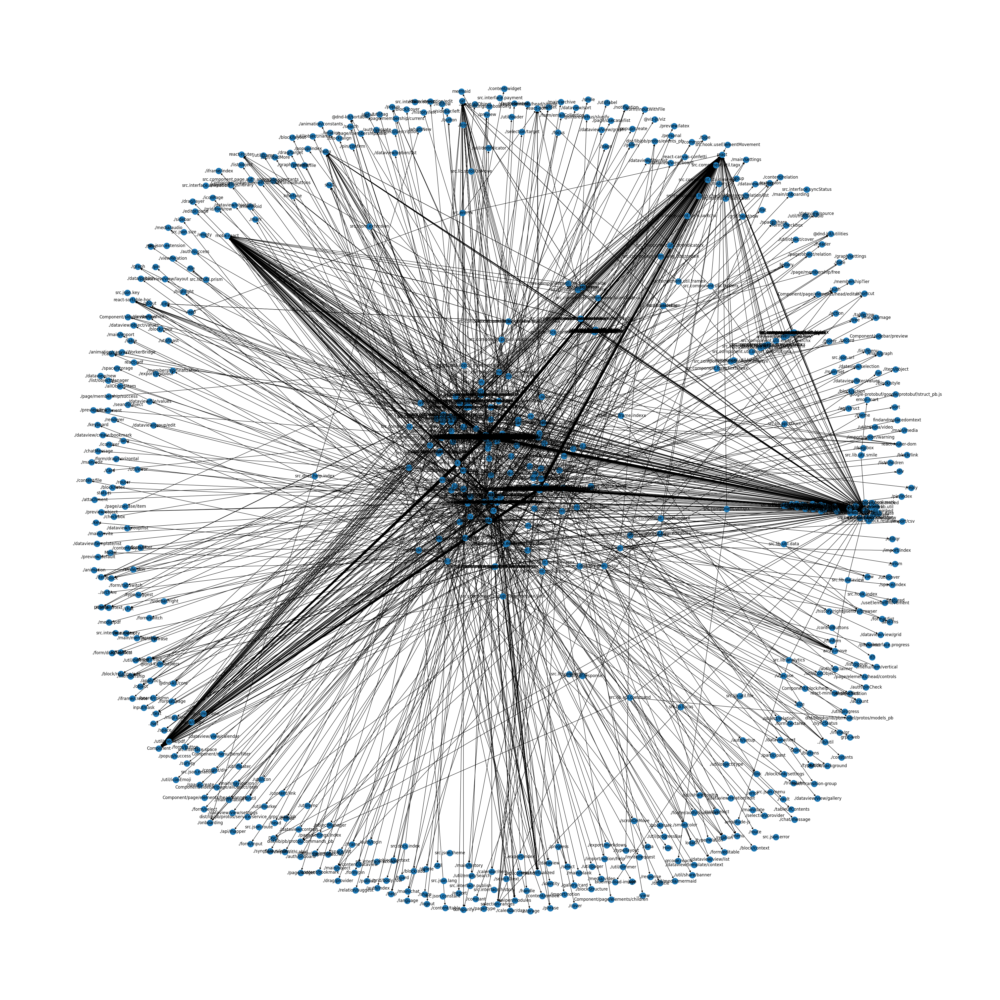

In [64]:
H = nx.DiGraph()

for file in all_files:

    source_module = module_name_from_file_path(file)

    if source_module not in H.nodes:
        H.add_node(source_module)

    for target_module in import_dict[source_module]:
        H.add_edge(source_module, target_module)


draw_graph(H, (40,40), with_labels=True)